# Prediksi Sampah Menggunakan Convolutional Neural Network

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input
from tensorflow.keras import layers, Model
from tensorflow.keras.utils import plot_model
from sklearn.utils.class_weight import compute_class_weight
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import pandas as pd
import cv2

In [2]:
warnings.filterwarnings("ignore")

Konvigurasi Dataset

In [3]:
# Konfigurasi
dataset_path = "../data/interim/Garbage classification"
dim = (512, 384)  # Sesuai resolusi asli gambar
input_shape = dim + (3,)
batch_size = 12
epochs = 25

# Data Generator dengan augmentasi minimal
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    shear_range=0.05,
    zoom_range=0.05,
    horizontal_flip=True,
    rotation_range=5,
    width_shift_range=0.1,
    height_shift_range=0.1,
    brightness_range=[0.95, 1.05],
    validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    dataset_path,
    target_size=dim,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

val_generator = train_datagen.flow_from_directory(
    dataset_path,
    target_size=dim,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

Found 2024 images belonging to 6 classes.
Found 503 images belonging to 6 classes.


In [4]:
# Data Classes
print(os.listdir(dataset_path))

['metal', 'glass', 'paper', 'trash', 'cardboard', 'plastic']


In [5]:
main_folder_path = Path(dataset_path)

all_folders = [d for d in main_folder_path.glob('**/') if d.is_dir()]

# Count number of files in each class
data = []
for folder in all_folders:
    folder_name = folder.name
    file_count = len(list(folder.glob('*.*')))
    if folder_name != dataset_path:
        data.append({'Folder Name': folder_name, 'File Count': file_count})

count = pd.DataFrame(data)

count = count.set_index('Folder Name')
count

,File Count
Folder Name,
Garbage classification,0
metal,410
glass,501
paper,594
trash,137
cardboard,403
plastic,482


In [6]:
print(f'Total {count.sum()}')

Total File Count    2527
dtype: int64


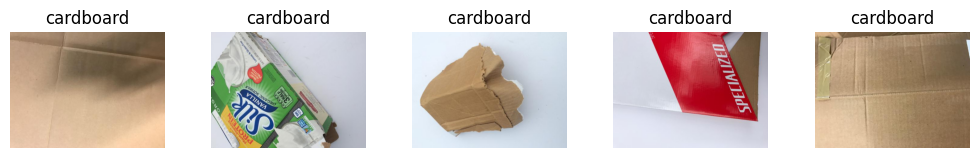

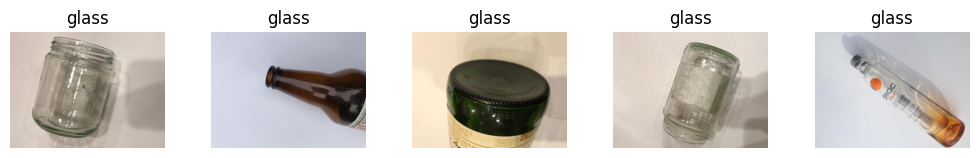

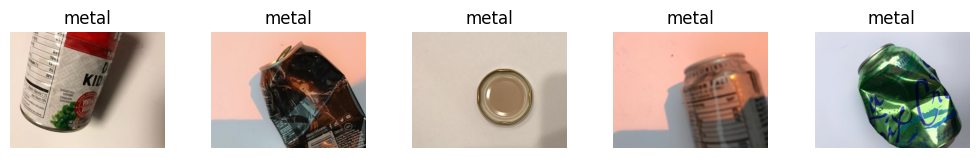

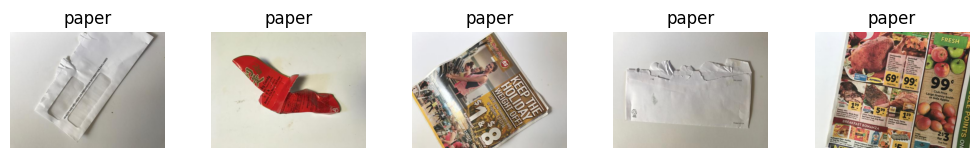

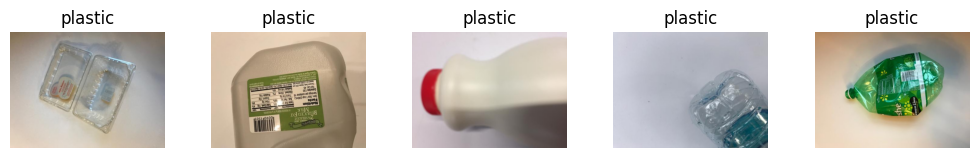

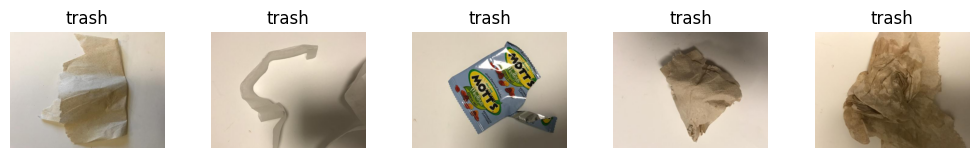

In [7]:
# Show five image of each class
def plot_imgs(item_dir, top=10):
    all_item_dirs = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dirs][:5]

    plt.figure(figsize=(10, 10))

    for idx, img_path in enumerate(item_files):
        plt.subplot(5, 5, idx+1)

        img = plt.imread(img_path)
        plt.tight_layout()
        plt.imshow(img, cmap='gray')
        plt.axis('off')
        plt.title(os.path.basename(item_dir))

plot_imgs(dataset_path+'/cardboard')
plot_imgs(dataset_path+'/glass')
plot_imgs(dataset_path+'/metal')
plot_imgs(dataset_path+'/paper')
plot_imgs(dataset_path+'/plastic')
plot_imgs(dataset_path+'/trash')

Arsitektur Model

In [8]:
# Model dengan MobileNetV3Large
base_model = MobileNetV3Large(
    input_shape=input_shape,
    include_top=False,
    weights='imagenet'
)

base_model.trainable = False

# Custom layers
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)
x = layers.Dense(512, activation="relu")(x)
x = layers.Dropout(0.2)(x)
predictions = layers.Dense(6, activation="softmax")(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Callbacks dengan format file yang diperbarui
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_accuracy',
        patience=5,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=3,
        min_lr=1e-6
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'best_garbage_model.keras',  # Perubahan ekstensi file
        save_best_only=True,
        monitor='val_accuracy'
    )
]

12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.473129 to fit



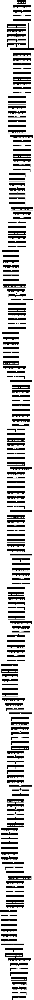

In [9]:
plot_model(model, show_shapes=True, show_layer_names=False)

Training Model

In [10]:
# Initial training
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
model.compile(
    optimizer=optimizer,
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=15,
    validation_data=val_generator,
    validation_steps=val_generator.samples // batch_size,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 139s 711ms/step - accuracy: 0.4946 - loss: 1.3192 - val_accuracy: 0.7459 - val_loss: 0.6946 - learning_rate: 1.0000e-04
Epoch 2/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - accuracy: 0.7500 - loss: 0.5976 - val_accuracy: 0.7273 - val_loss: 0.6724 - learning_rate: 1.0000e-04
Epoch 3/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 103s 593ms/step - accuracy: 0.8254 - loss: 0.5039 - val_accuracy: 0.7846 - val_loss: 0.5339 - learning_rate: 1.0000e-04
Epoch 4/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step - accuracy: 0.9167 - loss: 0.3692 - val_accuracy: 0.5455 - val_loss: 0.9043 - learning_rate: 1.0000e-04
Epoch 5/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 103s 592ms/step - accuracy: 0.8611 - loss: 0.3874 - val_accuracy: 0.7947 - val_loss: 0.5087 - learning_rate: 1.0000e-04
Epoch 6/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8333 - loss: 0.4334 - val_accuracy: 0.9091 - val_loss: 0.5862 - learning_rate: 1.0000e-04
Epoch 7/15
168/168 ━━━━━━━━━━━━━━━━━━━━ 104s 596m

Fine-tuning

In [11]:
# Fine-tuning
base_model.trainable = True
for layer in base_model.layers[:-20]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

fine_tune_history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=10,
    validation_data=val_generator,
    validation_steps=val_generator.samples // batch_size,
    callbacks=callbacks,
    verbose=1
)

# Evaluasi dan simpan model dengan format yang diperbarui
model.save('garbage_classifier_final1.keras')


Epoch 1/10
168/168 ━━━━━━━━━━━━━━━━━━━━ 124s 634ms/step - accuracy: 0.9065 - loss: 0.2946 - val_accuracy: 0.8232 - val_loss: 0.4837 - learning_rate: 5.0000e-05
Epoch 2/10
168/168 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.9167 - loss: 0.2646 - val_accuracy: 0.9091 - val_loss: 0.4289 - learning_rate: 5.0000e-05
Epoch 3/10
168/168 ━━━━━━━━━━━━━━━━━━━━ 102s 585ms/step - accuracy: 0.9277 - loss: 0.2119 - val_accuracy: 0.8374 - val_loss: 0.4983 - learning_rate: 5.0000e-05
Epoch 4/10
168/168 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8333 - loss: 0.1960 - val_accuracy: 0.7273 - val_loss: 0.6316 - learning_rate: 5.0000e-05
Epoch 5/10
168/168 ━━━━━━━━━━━━━━━━━━━━ 102s 587ms/step - accuracy: 0.9485 - loss: 0.1682 - val_accuracy: 0.8455 - val_loss: 0.5144 - learning_rate: 5.0000e-05


Visualisasi Hasil Training

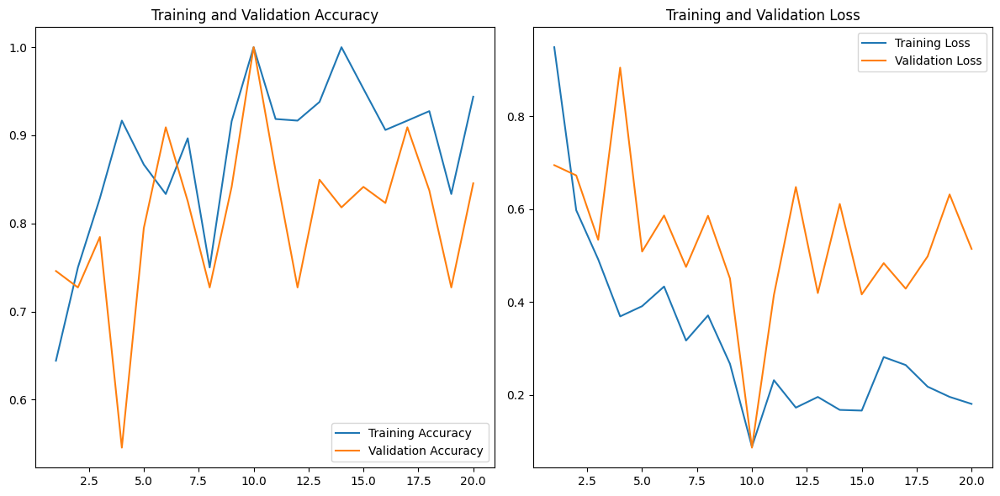

In [12]:
# Plot accuracy dan loss
acc = history.history['accuracy'] + fine_tune_history.history['accuracy']
val_acc = history.history['val_accuracy'] + fine_tune_history.history['val_accuracy']
loss = history.history['loss'] + fine_tune_history.history['loss']
val_loss = history.history['val_loss'] + fine_tune_history.history['val_loss']

epochs_range = range(1, len(acc) + 1)

plt.figure(figsize=(12, 6))

# Plot Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

plt.tight_layout()
plt.show()


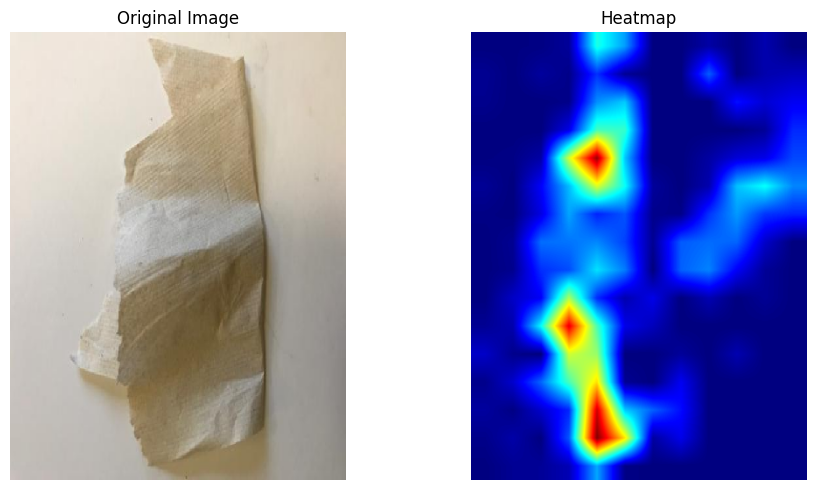

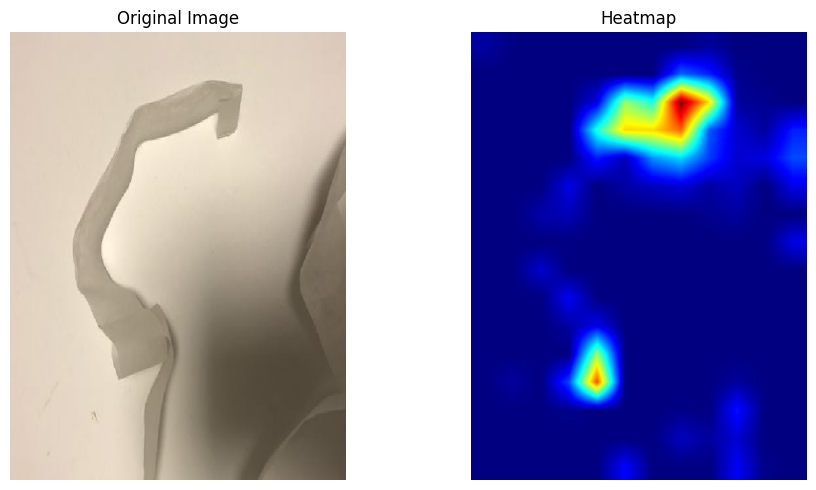

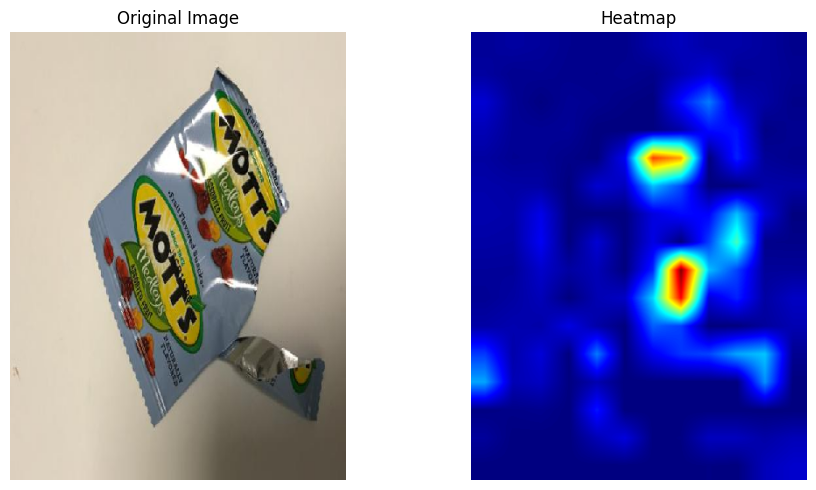

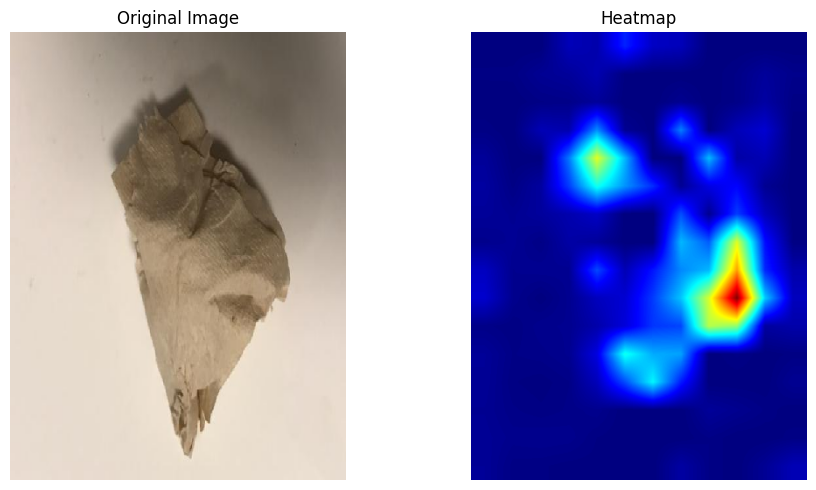

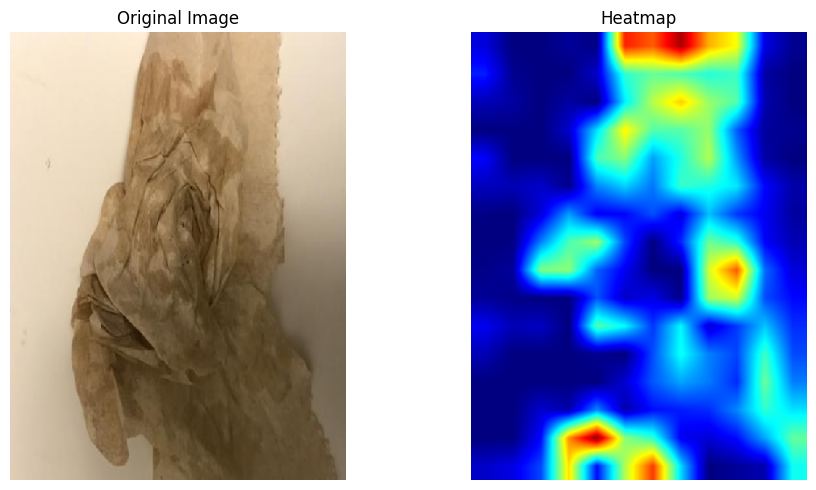

...

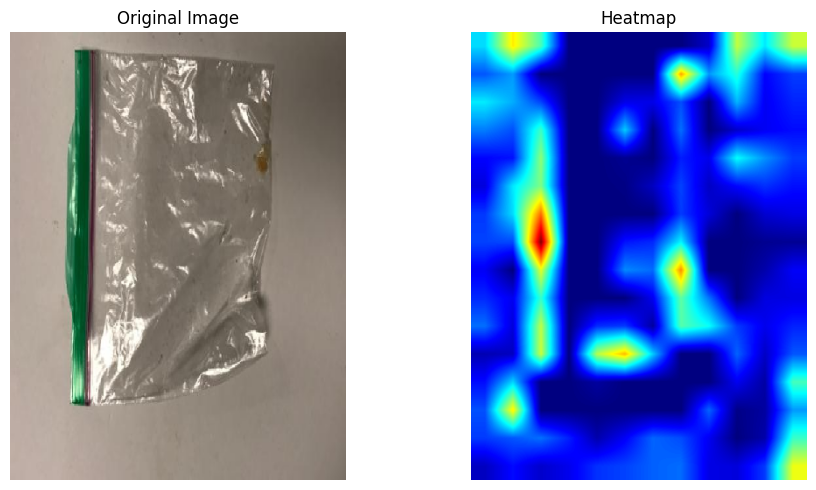

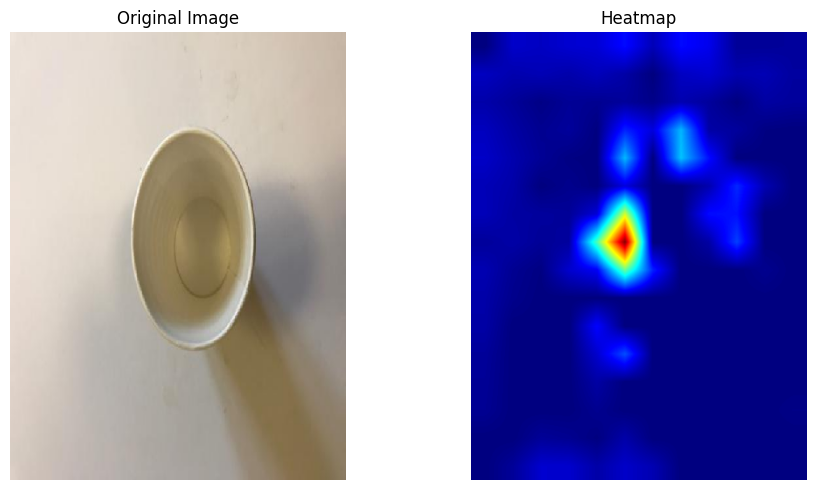

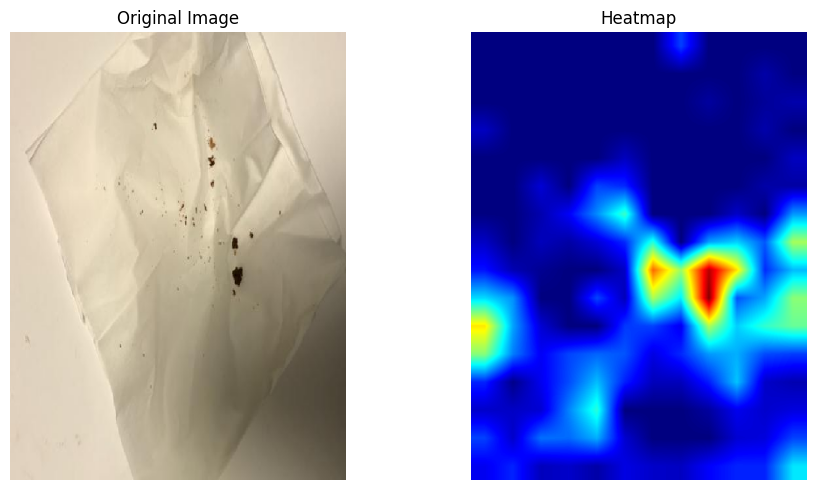

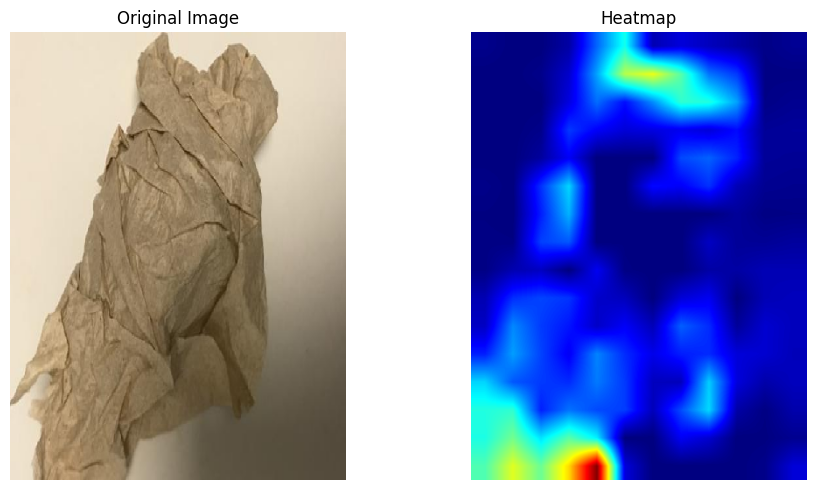

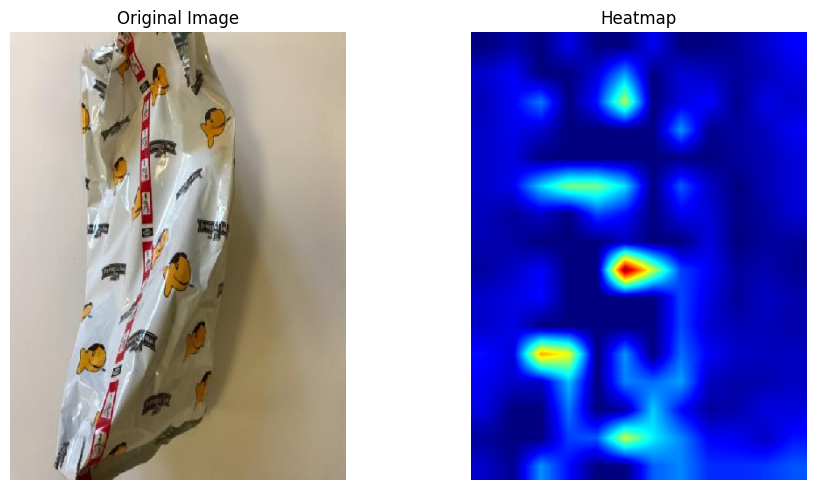

In [ ]:
# Heatmap

def generate_gradcam(model, img_array, layer_name='activation_19'):
    # Membuat model gradien untuk Grad-CAM
    grad_model = tf.keras.models.Model(
        [model.inputs], 
        [model.get_layer(layer_name).output, model.output]
    )
    
    # Menghitung gradien untuk kelas prediksi tertinggi
    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(img_array)
        pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]
    
    # Menghitung bobot gradien rata-rata
    grads = tape.gradient(class_channel, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    # Membuat heatmap dari hasil perkalian output konvolusi dengan bobot
    conv_output = conv_output[0]
    heatmap = conv_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    heatmap = heatmap.numpy()
    
    # Mengubah ukuran dan membuat visualisasi heatmap
    heatmap = cv2.resize(heatmap, (img_array.shape[2], img_array.shape[1]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    
    return heatmap

# Path folder dataset
base_path = "/kaggle/input/garbage-classification-ds/Garbage-classification/Garbage classification/trash/"

# Mendapatkan daftar semua file gambar dalam folder
image_paths = []
for root, dirs, files in os.walk(base_path):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_paths.append(os.path.join(root, file))

# Memproses setiap gambar
for img_path in image_paths:
    # Membaca dan preprocessing gambar
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=dim)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Menampilkan gambar asli dan heatmap
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    heatmap = generate_gradcam(model, img_array)
    plt.imshow(heatmap)
    plt.title('Heatmap')
    plt.axis('off')

    plt.tight_layout()
    plt.show()
